In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
%matplotlib inline

import sys
import datacube

from IPython.display import Image
from odc.ui import image_aspect

import numpy as np
import pandas as pd
import xarray as xr

sys.path.append('../Scripts')
from deafrica_datahandling import load_ard, wofs_fuser
from deafrica_plotting import display_map, rgb, xr_animation
from deafrica_dask import create_local_dask_cluster

from datacube.utils.aws import configure_s3_access
configure_s3_access(aws_unsigned=True, cloud_defaults=True)

In [2]:
dc = datacube.Datacube(app="water_extent_exercise")

In [3]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:35425 Dashboard: /user/arkriger/proxy/8787/status,Cluster Workers: 1 Cores: 2 Memory: 14.18 GB


In [4]:
# Define the area of interest
lat = -6.0873
lon = 35.1817

#change shape - square, rectangle
lat_buffer = 0.2
lon_buffer = 0.2

# Combine central lat, lon with buffer to get area of interest
lat_range = (lat - lat_buffer, lat + lat_buffer)
lon_range = (lon - lon_buffer, lon + lon_buffer)

# Define the year
time = '2018'

In [5]:
display_map(x=lon_range, y=lat_range)

In [29]:
query = {
    'x': lon_range,
    'y': lat_range,
    'resolution': (-30, 30),
    'output_crs':'EPSG:6933',
    'group_by': 'solar_day',
    'time': (time),
}

In [30]:
ds_landsat = load_ard(dc=dc,
                      products=['ls8_usgs_sr_scene'],
                      measurements=['red', 'green', 'blue'],
                      **query)

ds_landsat

Using pixel quality parameters for USGS Collection 1
Finding datasets
    ls8_usgs_sr_scene
Applying pixel quality/cloud mask
Loading 44 time steps


<xarray.Dataset>
Dimensions:      (time: 44, x: 1287, y: 1693)
Coordinates:
  * y            (y) float64 -7.498e+05 -7.498e+05 ... -8.005e+05 -8.005e+05
  * time         (time) datetime64[ns] 2018-01-04T07:51:05.647190 ... 2018-12...
    spatial_ref  int32 6933
  * x            (x) float64 3.375e+06 3.375e+06 ... 3.414e+06 3.414e+06
Data variables:
    red          (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    green        (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    blue         (time, y, x) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

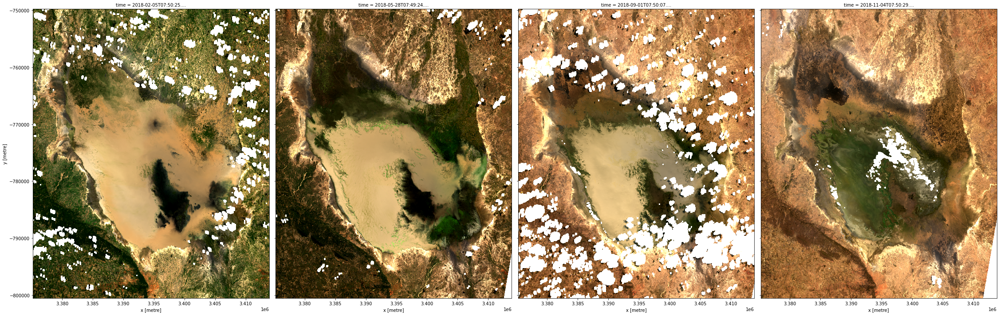

In [31]:
rgb(ds_landsat, bands=['red', 'green', 'blue'], 
    index=[4, 17, 29, 37], size=10)                     

In [32]:
#load water from space
ds_wofs = dc.load(product=["ga_ls8c_wofs_2"],
         fuse_func=wofs_fuser,
         **query
        )

ds_wofs

<xarray.Dataset>
Dimensions:      (time: 46, x: 1287, y: 1693)
Coordinates:
  * time         (time) datetime64[ns] 2018-01-04T07:50:41.718027 ... 2018-12...
  * y            (y) float64 -7.498e+05 -7.498e+05 ... -8.005e+05 -8.005e+05
  * x            (x) float64 3.375e+06 3.375e+06 ... 3.414e+06 3.414e+06
    spatial_ref  int32 6933
Data variables:
    water        (time, y, x) uint8 64 64 64 64 64 64 64 ... 0 64 64 64 64 64 64
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

In [33]:
#extract water pixel
ds_valid_water = ds_wofs.water == 128

In [34]:
#calculate the area of covered by a pixels using the parameters from the resolution

pixel_length = query["resolution"][1]             # in metres
m_per_km = 1000                                   # conversion from metres to kilometres
area_per_pixel = pixel_length**2 / m_per_km**2

In [35]:
#calculate the area of water pixels 

ds_valid_water_pixel_sum = ds_valid_water.sum(dim=['x', 'y'])
ds_valid_water_area = ds_valid_water_pixel_sum * area_per_pixel

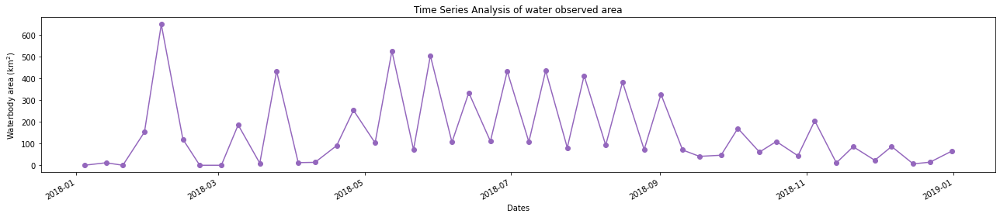

In [36]:
plt.figure(figsize=(18, 4))
ds_valid_water_area.plot(marker='o', color='#9467bd')
plt.title('Time Series Analysis of water observed area')
plt.xlabel('Dates')
plt.ylabel('Waterbody area (km$^2$)')
plt.tight_layout()

NameError: name 'timestep' is not defined

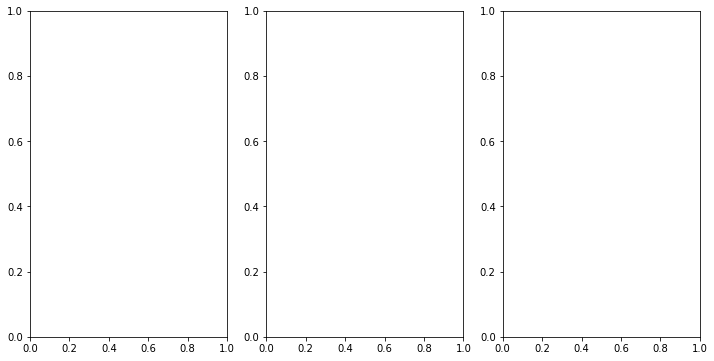

In [37]:
timestep_1 = 4
timestep_2 = 10
timestep_3 = 16
timestep_4 = 38

# Plot water extent
fig, ax = plt.subplots(1, 3, figsize=(12, 6))

#plot the true colour image
ds_nearest_landsat = ds_landsat.sel(time=ds_wofs.time.isel(time=timestep), method='nearest')
rgb(ds_nearest_landsat, ax=ax[0])

# plot the water extent from WOfS
ds_wofs.isel(time=timestep_1).water.plot.imshow(ax=ax[1], cmap="Blues", add_colorbar=False)
ds_wofs.isel(time=timestep_2).water.plot.imshow(ax=ax[2], cmap="Blues", add_colorbar=False)
ds_wofs.isel(time=timestep_3).water.plot.imshow(ax=ax[3], cmap="Blues", add_colorbar=False)
ds_wofs.isel(time=timestep_4).water.plot.imshow(ax=ax[4], cmap="Blues", add_colorbar=False)

# Titles
ax[0].set_title("Water Extent - Landsat"), ax[0].xaxis.set_visible(False), ax[0].yaxis.set_visible(False)
ax[1].set_title("Water Extent (Full) - WOFS"), ax[1].xaxis.set_visible(False), ax[1].yaxis.set_visible(False)
ax[2].set_title("Water Extent (Empty) - WOFS"), ax[2].xaxis.set_visible(False), ax[2].yaxis.set_visible(False)
ax[3].set_title("Water Extent (Empty) - WOFS"), ax[3].xaxis.set_visible(False), ax[3].yaxis.set_visible(False)
ax[4].set_title("Water Extent (Empty) - WOFS"), ax[4].xaxis.set_visible(False), ax[4].yaxis.set_visible(False)

plt.show()

In [ ]:
#go further with larger time range, min_gooddata = 0.75 and statistical min and max

In [6]:
# Define the start year and end year
start_year = '2013'
end_year = '2019'

In [7]:
#Create a query object
query = {
    'x': lon_range,
    'y': lat_range,
    'resolution': (-30, 30),
    'output_crs':'EPSG:6933',
    'time': (start_year, end_year)
    #'dask_chunks':{'time':1,'x':1000,'y':1000}
}

In [8]:
ds_landsat = load_ard(dc=dc,
                      products=['ls8_usgs_sr_scene'],
                      measurements=['red', 'green', 'blue'],
                      min_gooddata = 0.75,
                      **query)

ds_landsat

Using pixel quality parameters for USGS Collection 1
Finding datasets
    ls8_usgs_sr_scene
Counting good quality pixels for each time step
Filtering to 61 out of 546 time steps with at least 75.0% good quality pixels
Applying pixel quality/cloud mask
Loading 61 time steps


<xarray.Dataset>
Dimensions:      (time: 61, x: 1287, y: 1693)
Coordinates:
  * y            (y) float64 -7.498e+05 -7.498e+05 ... -8.005e+05 -8.005e+05
  * time         (time) datetime64[ns] 2013-04-28T07:52:19.328647 ... 2019-12...
    spatial_ref  int32 6933
  * x            (x) float64 3.375e+06 3.375e+06 ... 3.414e+06 3.414e+06
Data variables:
    red          (time, y, x) float32 986.0 nan nan nan ... 1161.0 1228.0 1250.0
    green        (time, y, x) float32 990.0 nan nan nan ... 1044.0 1073.0 1071.0
    blue         (time, y, x) float32 582.0 nan nan nan ... 640.0 643.0 646.0
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

In [9]:
# Load WOfS
ds_wofs = dc.load(product=["ga_ls8c_wofs_2"],
             fuse_func=wofs_fuser,
             group_by='solar_day',
             **query
            )

In [10]:
#Calculate the area per pixel

pixel_length = query["resolution"][1]  # in metres
m_per_km = 1000  # conversion from metres to kilometres
area_per_pixel = pixel_length**2 / m_per_km**2

In [11]:
#Calculating the extent of water

# select WOfS images at same timesteps as the Landsat data
ds_valid = ds_wofs.sel(time=ds_landsat.time, method='nearest')

#remove any duplicate time-stamps
index = np.unique(ds_valid.time, return_index=True)
ds_valid = ds_valid.isel(time=index[1])

# Only show water pixels
ds_valid_water = ds_valid.water == 128

# Calculate area of water pixels
ds_valid_water_area = ds_valid_water.sum(dim=['x', 'y']) * area_per_pixel

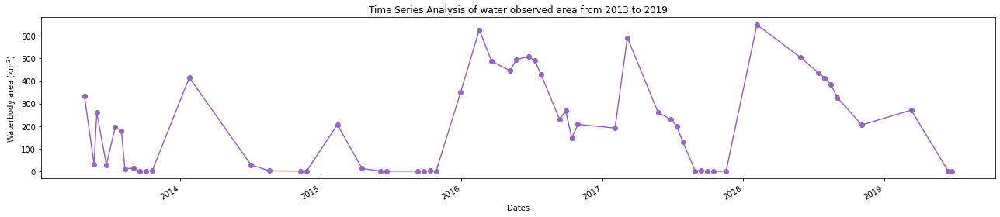

In [12]:
plt.figure(figsize=(18, 4))
ds_valid_water_area.plot(marker='o', color='#9467bd')
plt.title(f'Time Series Analysis of water observed area from {start_year} to {end_year}')
plt.xlabel('Dates')
plt.ylabel('Waterbody area (km$^2$)')
plt.tight_layout()

In [13]:
#calculate min and max
min_water_area_date, max_water_area_date =  min(ds_valid_water_area), max(ds_valid_water_area)
time_xr = xr.DataArray([min_water_area_date.time.values, max_water_area_date.time.values], dims=["time"])

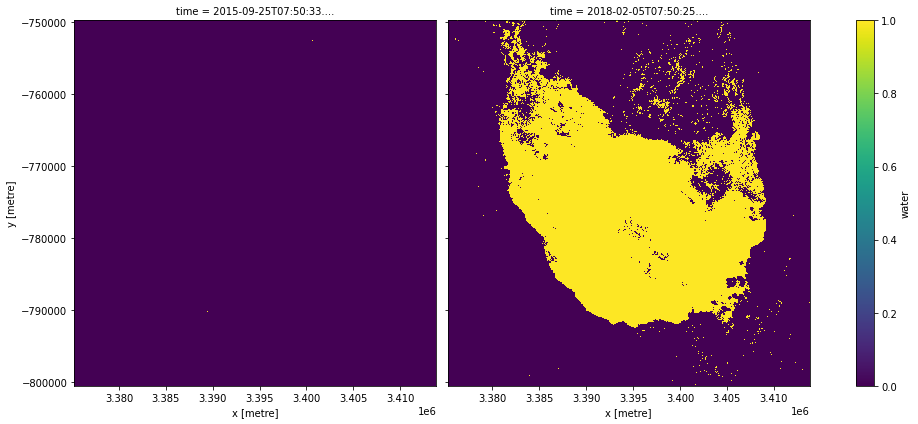

In [14]:
ds_valid_water.sel(time=time_xr).plot.imshow("x","y",col="time", col_wrap=2, robust=True, figsize=(14, 6), 
                                             cmap='viridis')
plt.show()

In [15]:
def closest_date(list_of_dates, desired_date):
    return min(list_of_dates,
               key=lambda x: abs(x - np.datetime64(desired_date)))

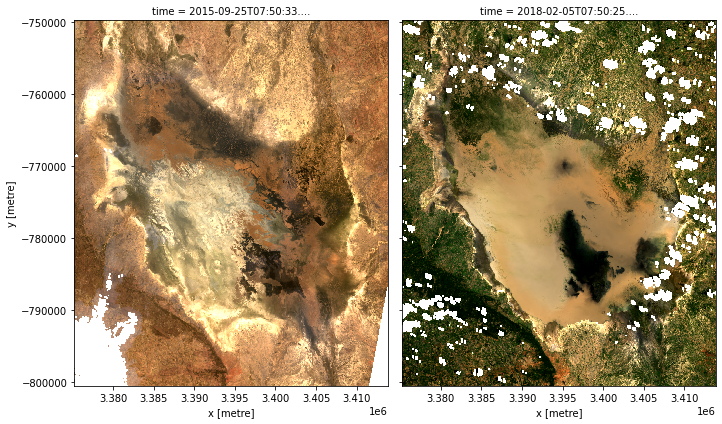

In [16]:
#Plot the Equivalent landsat (water classified pixel) for the two dates where we have the minimum and maximum surface water extent

#Determine if data return for landsat  
if ds_landsat.time.size:
    min_water_area_date_landsat = closest_date(ds_landsat.time.values, 
                                               min_water_area_date.time.values.astype(str))
    max_water_area_date_landsat = closest_date(ds_landsat.time.values, 
                                               max_water_area_date.time.values.astype(str))

    time_xr_landsat = xr.DataArray([min_water_area_date_landsat, max_water_area_date_landsat], dims=["time"])
    ds_landsat_valid = ds_landsat.sel(time=time_xr_landsat)
    rgb(ds_landsat_valid, col='time') 

Exporting animation to water_extent.gif


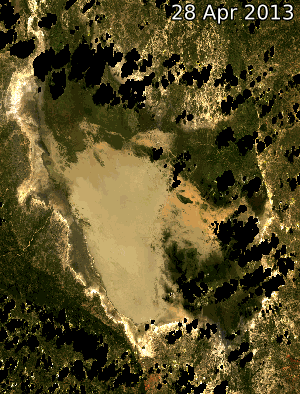

In [17]:
#animate the time series

xr_animation(ds=ds_landsat, 
             output_path='water_extent.gif',
             bands = ['red', 'green', 'blue'],
             interval=200, 
             width_pixels=300,
             show_colorbar=False
            )

# Plot animated gif
plt.close()
Image(filename='water_extent.gif')

In [18]:
#compare two time periods
baseline_year = 2016
analysis_year = 2019

baseline_ds, analysis_ds = max(ds_valid_water_area[ds_valid_water_area['time.year'] == baseline_year]),
max(ds_valid_water_area[ds_valid_water_area['time.year'] == analysis_year])

In [19]:
time_xr = xr.DataArray([baseline_ds.time.values, analysis_ds.time.values], dims=["time"])

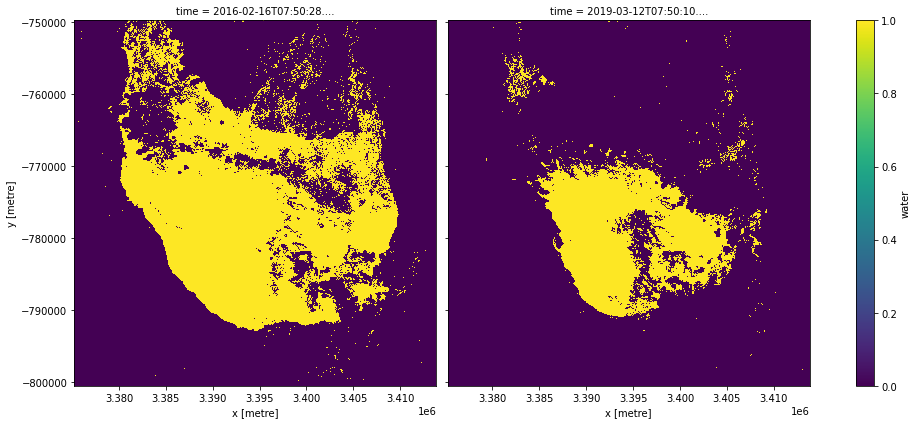

In [21]:
#plot the min and max
ds_valid_water.sel(time=time_xr).plot.imshow("x","y",col="time", col_wrap=2, robust=True, figsize=(14, 6), 
                                             cmap='viridis')
plt.show()

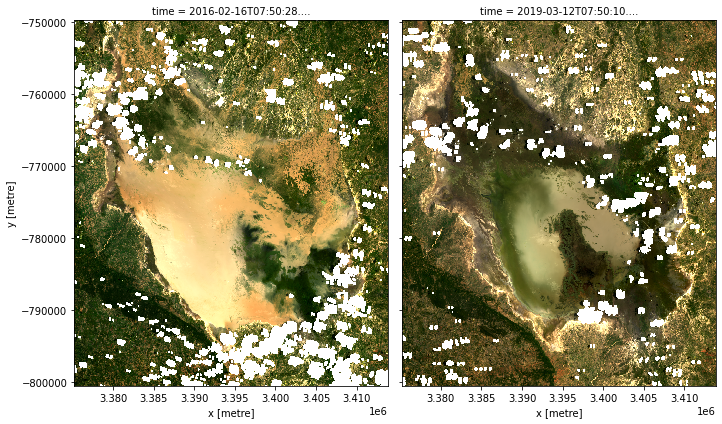

In [22]:
#plot the rgb for these min and max values
if ds_landsat.time.size:
    min_water_area_date_landsat = closest_date(ds_landsat.time.values, baseline_ds.time.values.astype(str))
    max_water_area_date_landsat = closest_date(ds_landsat.time.values, analysis_ds.time.values.astype(str))
    time_xr_landsat = xr.DataArray([min_water_area_date_landsat, max_water_area_date_landsat], dims=["time"])
    rgb(ds_landsat.sel(time=time_xr_landsat), col='time') 

In [23]:
#calculate the change between the two

# The two period Extract the two periods(Baseline and analysis) dataset from
ds_selected = ds_valid_water.sel(time=time_xr)

#The dataset array is transform to 1 and 0 using the `astype(int)` function.
analyse_total_value = ds_selected[1].astype(int)
change = analyse_total_value - ds_selected[0].astype(int)

#The various scenarios are extracted from the `change` variable for the tw years
#Water gain  is 1
water_appeared = change.where(change == 1)

#Permanent water = 0
permanent_water = change.where((change == 0) & (analyse_total_value == 1))

#Permanent Land = 0
permanent_land = change.where((change == 0) & (analyse_total_value == 0))

#Water loss = -1
water_disappeared = change.where(change == -1)

In [24]:
#calculate the area of water extent for water_loss, water_gain, permanent water and land 

total_area = analyse_total_value.count().values * area_per_pixel
water_apperaed_area = water_appeared.count().values * area_per_pixel
permanent_water_area = permanent_water.count().values * area_per_pixel
permanent_land_area = permanent_land.count().values * area_per_pixel
water_disappeared_area = water_disappeared.count().values * area_per_pixel

In [25]:
#calculate the percentage of area of water extent for water_loss, water_gain, permanent water and land

# Percentage Change in water extent
percentage_water_gain = round((water_apperaed_area /  total_area) * 100 , 2)
percentage_water_loss = round(water_disappeared_area /  total_area * 100 , 2)
percentage_permanent_water = round(permanent_water_area /  total_area * 100 , 2)
percentage_permanent_land = round(permanent_land_area /  total_area * 100, 2)

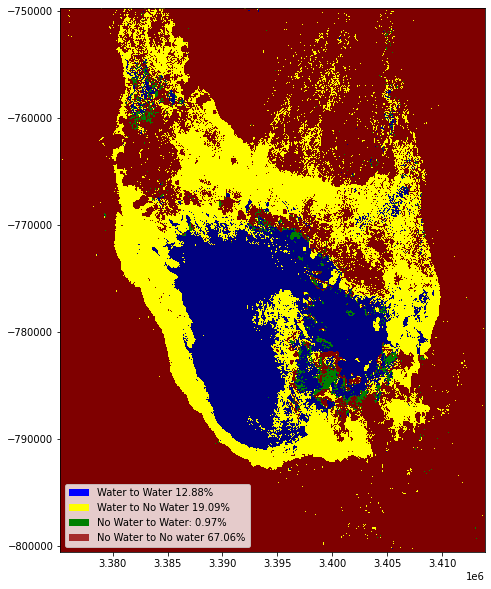

In [28]:
#plot

water_appeared_color = 'Green'
water_disappeared_color = 'Yellow'
stable_color = 'Blue'
land_color = 'Brown'

plot_aspect = image_aspect(ds_valid_water)

ds_valid_water.sel(time=time_xr[1]).plot.imshow(cmap='jet_r', add_colorbar=False, add_labels=False, size=10, aspect=plot_aspect)
water_appeared.plot.imshow(cmap=ListedColormap([water_appeared_color]), add_colorbar=False, add_labels=False)
water_disappeared.plot.imshow(cmap=ListedColormap([water_disappeared_color]), add_colorbar=False, add_labels=False)

plt.legend(
        [Patch(facecolor=stable_color), Patch(facecolor=water_disappeared_color), Patch(facecolor=water_appeared_color),   Patch(facecolor=land_color)], 
        [f'Water to Water {percentage_permanent_water}%', f'Water to No Water {percentage_water_loss}%' , f'No Water to Water: {percentage_water_gain}%',  
         f'No Water to No water {percentage_permanent_land}%'],
         loc = 'lower left'
    );